In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import VOCSegmentation
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

In [2]:
class ContractingBlock(nn.Module):
  def __init__(self, input_channels, use_dropout=False, use_bn=True):
    super(ContractingBlock, self).__init__()
    self.conv1 = nn.Conv2d(input_channels, input_channels*2, kernel_size=3, padding=1)
    self.conv2 = nn.Conv2d(input_channels*2, input_channels*2, kernel_size=3, padding=1)
    self.activation = nn.LeakyReLU(0.2)
    self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
    if use_bn:
      self.batchnorm = nn.BatchNorm2d(input_channels*2)
    self.use_bn = use_bn
    if use_dropout:
      self.dropout = nn.Dropout()
    self.use_dropout = use_dropout

  def forward(self, x):
    x = self.conv1(x)
    if self.use_bn:
      x = self.batchnorm(x)
    if self.use_dropout:
      x= self.dropout(x)
    x = self.activation(x)
    x = self.conv2(x)
    if self.use_bn:
      x = self.batchnorm(x)
    if self.use_dropout:
      x = self.dropout(x)
    x = self.activation(x)
    x = self.maxpool(x)
    return x

In [3]:
class ExpandingBlock(nn.Module):
  def __init__(self, input_channels, use_dropout=False, use_bn=True):
    super(ExpandingBlock, self).__init__()
    self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
    self.conv1 = nn.Conv2d(input_channels, input_channels//2, kernel_size=2)
    self.conv2 = nn.Conv2d(input_channels, input_channels//2, kernel_size=3, padding=1)
    self.conv3 = nn.Conv2d(input_channels//2, input_channels//2, kernel_size=2, padding=1)
    if use_bn:
      self.batchnorm = nn.BatchNorm2d(input_channels//2)
    self.use_bn = use_bn
    self.activation = nn.ReLU()
    if use_dropout:
      self.dropout = nn.Dropout()
    self.use_dropout = use_dropout

  def forward(self, x, skip_con_x):
    x = self.upsample(x)
    x = self.conv1(x)
    skip_con_x = crop(skip_con_x, x.shape)
    x = torch.cat([x, skip_con_x], axis=1)
    x = self.conv2(x)
    if self.use_bn:
      x = self.batchnorm(x)
    if self.use_dropout:
      x = self.dropout(x)
    x = self.activation(x)
    x = self.conv3(x)
    if self.use_bn:
      x = self.batchnorm(x)
    if self.use_dropout:
      x = self.dropout(x)
    x = self.activation(x)
    return x

In [4]:
def crop(image, new_shape):
  middle_height = image.shape[2] // 2
  middle_width = image.shape[3] // 2
  starting_height = middle_height - new_shape[2] // 2
  final_height = starting_height + new_shape[2]
  starting_width = middle_width - new_shape[3] // 2
  final_width = starting_width + new_shape[3]
  cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
  return cropped_image

In [5]:
class FeatureMapBlock(nn.Module):
  def __init__(self, input_channels, output_channels):
    super(FeatureMapBlock, self).__init__()
    self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)

  def forward(self, x):
    x = self.conv(x)
    return x

In [6]:
class UNet(nn.Module):
  def __init__(self, input_channels, output_channels, hidden_channels=32):
    super(UNet, self).__init__()
    self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
    self.contract1 = ContractingBlock(hidden_channels, use_dropout=True)
    self.contract2 = ContractingBlock(hidden_channels*2, use_dropout=True)
    self.contract3 = ContractingBlock(hidden_channels*4, use_dropout=True)
    self.contract4 = ContractingBlock(hidden_channels*8)
    self.contract5 = ContractingBlock(hidden_channels*16)
    self.contract6 = ContractingBlock(hidden_channels*32)
    self.expand0 = ExpandingBlock(hidden_channels*64)
    self.expand1 = ExpandingBlock(hidden_channels*32)
    self.expand2 = ExpandingBlock(hidden_channels*16)
    self.expand3 = ExpandingBlock(hidden_channels*8)
    self.expand4 = ExpandingBlock(hidden_channels*4)
    self.expand5 = ExpandingBlock(hidden_channels*2)
    self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
    self.sigmoid = torch.nn.Sigmoid()

  def forward(self, x):
    x0 = self.upfeature(x)
    x1 = self.contract1(x0)
    x2 = self.contract2(x1)
    x3 = self.contract3(x2)
    x4 = self.contract4(x3)
    x5 = self.contract5(x4)
    x6 = self.contract6(x5)
    x7 = self.expand0(x6, x5)
    x8 = self.expand1(x7, x4)
    x9 = self.expand2(x8, x3)
    x10 = self.expand3(x9, x2)
    x11 = self.expand4(x10, x1)
    x12 = self.expand5(x11, x0)
    xn = self.downfeature(x12)
    return self.sigmoid(xn)

In [7]:
class Discriminator(nn.Module):
  def __init__(self, input_channels, hidden_channels=8):
    super(Discriminator, self).__init__()
    self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
    self.contract1 = ContractingBlock(hidden_channels, use_dropout=True)
    self.contract2 = ContractingBlock(hidden_channels*2, use_dropout=True)
    self.contract3 = ContractingBlock(hidden_channels*4, use_dropout=True)
    self.contract4 = ContractingBlock(hidden_channels*8)
    self.contract5 = ContractingBlock(hidden_channels*16)
    self.final = ContractingBlock(hidden_channels*32)

  def forward(self, x, y):
    x = torch.cat([x, y], axis=1)
    x0 = self.upfeature(x)
    x1 = self.contract1(x0)
    x2 = self.contract2(x1)
    x3 = self.contract3(x2)
    x4 = self.contract4(x3)
    x5 = self.contract5(x4)
    xn = self.final(x5)
    return xn

In [8]:
import torch.nn.functional as F

adv_criterion = nn.BCEWithLogitsLoss()
recon_criterion = nn.L1Loss()
lambda_recon = 200

n_epochs = 20
input_dim = 3
real_dim = 3
display_step = 200
batch_size = 4
lr = 0.0002
target_shape = 256
device = 'cuda'

In [9]:
transform = transforms.Compose([
                                transforms.ToTensor(),
            ])

import torchvision
dataset = torchvision.datasets.ImageFolder("./maps", transform=transform)

In [10]:
gen = UNet(input_dim, real_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(input_dim + real_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weight_init(m):
  if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
    torch.nn.init.normal_(m.weight, 0.0, 0.02)
  if isinstance(m, nn.BatchNorm2d):
    torch.nn.init.normal_(m.weight, 0.0, 0.02)
    torch.nn.init.constant_(m.bias, 0)


In [11]:
pretrained = False
if pretrained:
  loaded_state = torch.load("pix2pix_15000.pth")
  gen.load_state_dict(loaded_stat["gen"])
  gen_opt.load_state_dict(loaded_state["gen_opt"])
  disc.load_state_dict(loaded_state["disc"])
  disc_opt.load_state_dict(loaded_state["disc_opt"])
else:
  gen = gen.apply(weight_init)
  disc = disc.apply(weight_init)

In [12]:
def get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon):
  fake = gen(condition)
  disc_fake_hat = disc(fake.detach(), condition)
  gen_adv_loss = adv_criterion(disc_fake_hat, torch.ones_like(disc_fake_hat))
  gen_rec_loss = lambda_recon * recon_criterion(fake, real)
  gen_loss = gen_adv_loss + gen_rec_loss

  return gen_loss

In [13]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
  image_shifted = image_tensor
  image_unflat = image_shifted.detach().cpu().view(-1, *size)
  image_grid = make_grid(image_unflat[:num_images], nrow=5)
  plt.imshow(image_grid.permute(1, 2, 0).squeeze())
  plt.show()

  0%|          | 0/549 [00:00<?, ?it/s]

Pretrained inital state


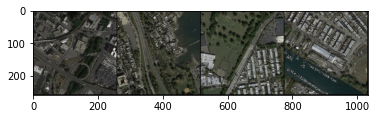

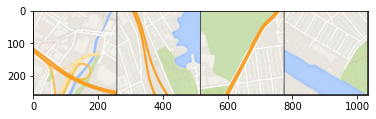

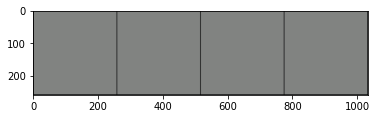

Epoch 0: Step 200: Generator (U-Net) loss: 73.52205406188963, Discriminator loss: 0.681803992688656


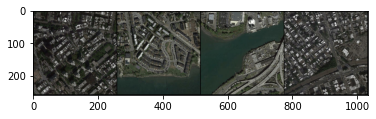

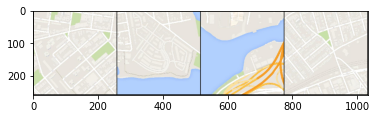

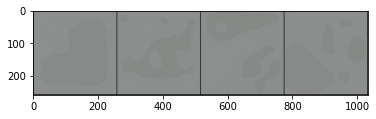

Epoch 0: Step 400: Generator (U-Net) loss: 59.6510408401489, Discriminator loss: 0.6604223370552061


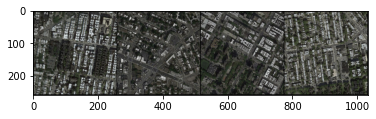

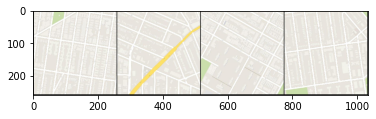

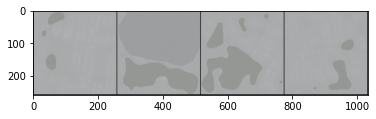

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 1: Step 600: Generator (U-Net) loss: 37.12330015182493, Discriminator loss: 0.6456780025362966


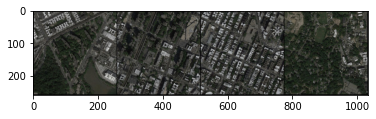

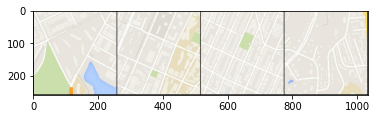

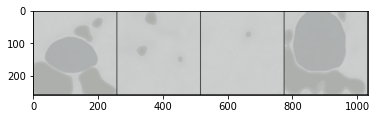

Epoch 1: Step 800: Generator (U-Net) loss: 19.273295168876643, Discriminator loss: 0.6331429705023764


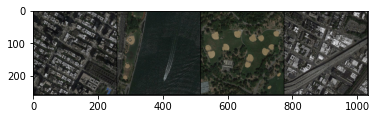

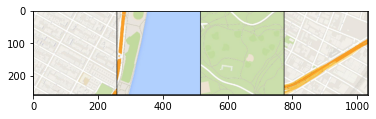

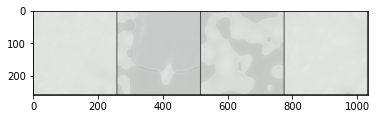

Epoch 1: Step 1000: Generator (U-Net) loss: 12.425253272056583, Discriminator loss: 0.6210325732827185


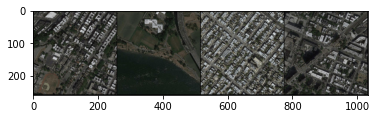

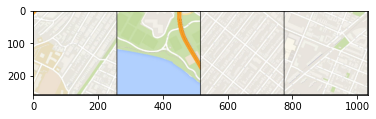

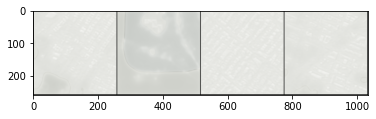

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 2: Step 1200: Generator (U-Net) loss: 11.271209220886226, Discriminator loss: 0.610425037145615


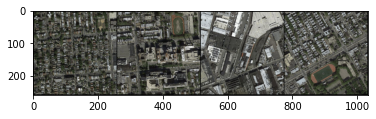

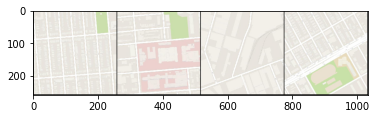

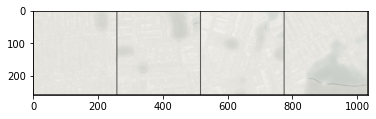

Epoch 2: Step 1400: Generator (U-Net) loss: 10.808296742439266, Discriminator loss: 0.6008549457788467


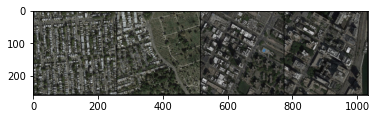

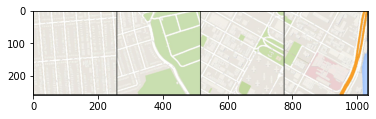

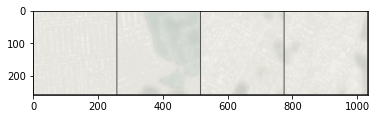

Epoch 2: Step 1600: Generator (U-Net) loss: 10.851148488521568, Discriminator loss: 0.5921392157673834


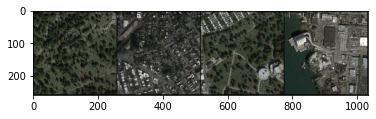

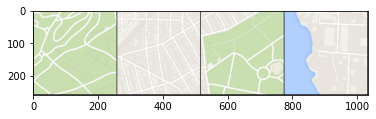

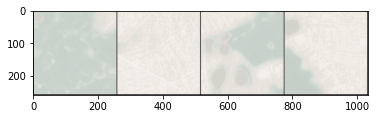

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 3: Step 1800: Generator (U-Net) loss: 10.367392024993896, Discriminator loss: 0.5841613852977754


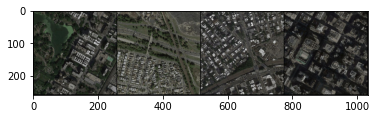

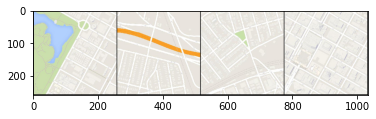

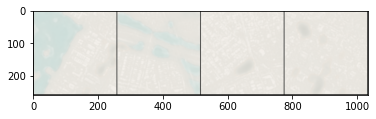

Epoch 3: Step 2000: Generator (U-Net) loss: 10.26877335071564, Discriminator loss: 0.6260011008381846


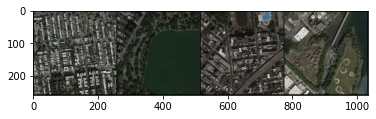

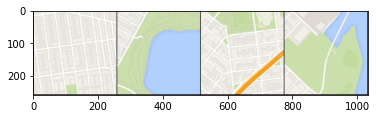

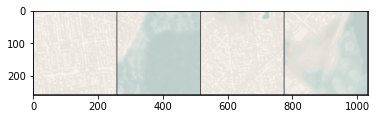

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 4: Step 2200: Generator (U-Net) loss: 10.165627632141119, Discriminator loss: 0.5802524131536486


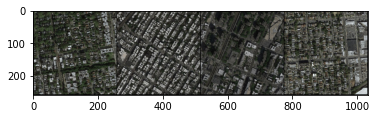

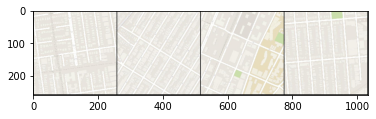

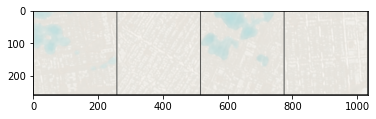

Epoch 4: Step 2400: Generator (U-Net) loss: 9.948561029434195, Discriminator loss: 0.5670445963740349


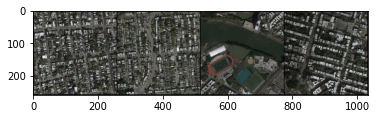

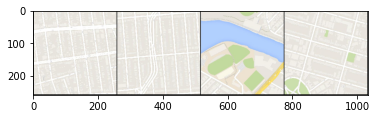

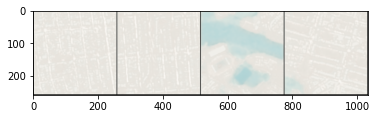

Epoch 4: Step 2600: Generator (U-Net) loss: 10.02433493852615, Discriminator loss: 0.6141556441783905


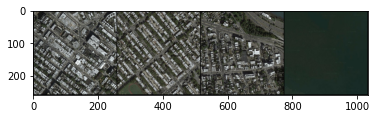

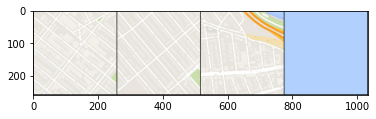

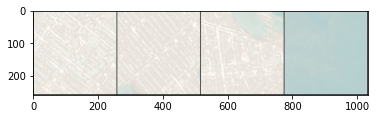

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 5: Step 2800: Generator (U-Net) loss: 9.72990055561066, Discriminator loss: 0.6419502526521683


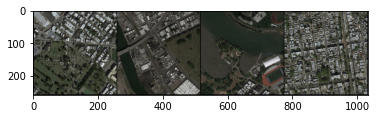

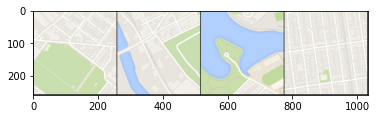

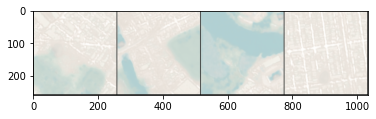

Epoch 5: Step 3000: Generator (U-Net) loss: 9.664519855976108, Discriminator loss: 0.5910058331489565


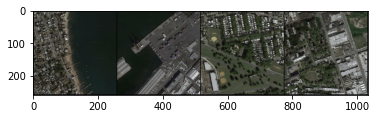

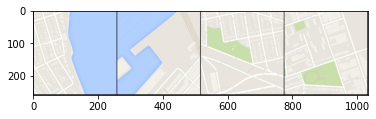

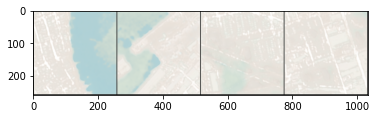

Epoch 5: Step 3200: Generator (U-Net) loss: 9.504916121959694, Discriminator loss: 0.5564759817719458


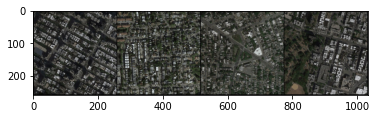

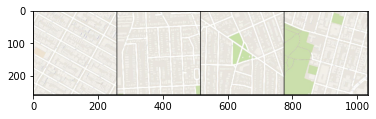

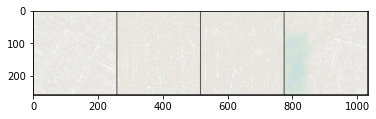

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 6: Step 3400: Generator (U-Net) loss: 9.424295332431795, Discriminator loss: 0.5525053015351297


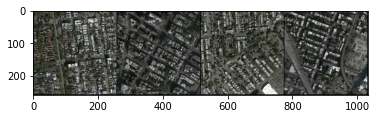

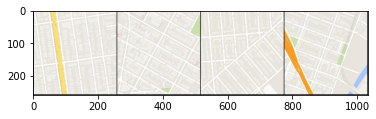

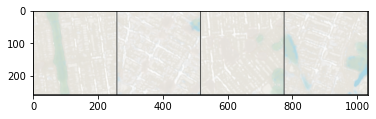

Epoch 6: Step 3600: Generator (U-Net) loss: 9.378234872817998, Discriminator loss: 0.5700820967555049


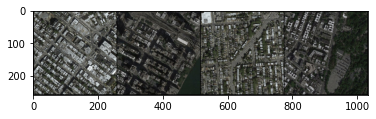

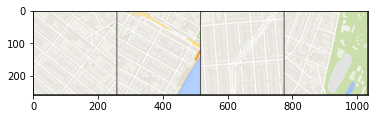

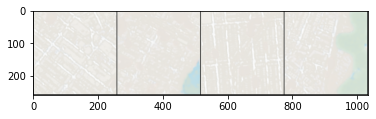

Epoch 6: Step 3800: Generator (U-Net) loss: 9.10551320314407, Discriminator loss: 0.5672533819079401


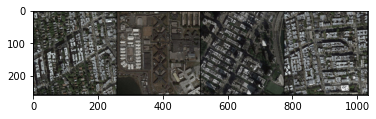

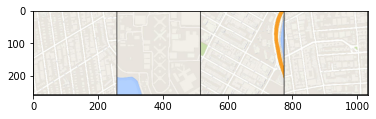

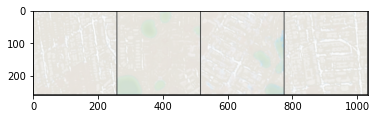

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 7: Step 4000: Generator (U-Net) loss: 8.954007489681247, Discriminator loss: 0.5535682463645936


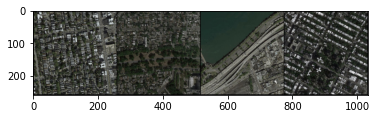

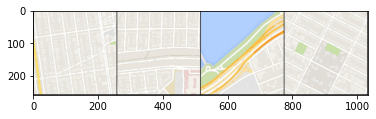

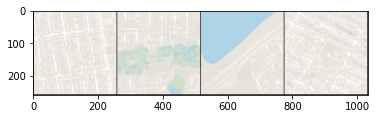

Epoch 7: Step 4200: Generator (U-Net) loss: 8.928372428417209, Discriminator loss: 0.6153341197967531


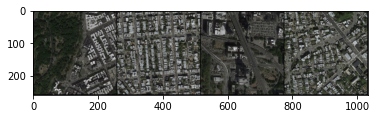

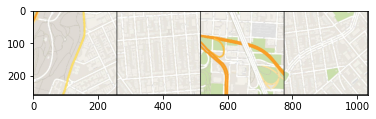

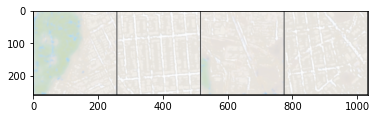

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 8: Step 4400: Generator (U-Net) loss: 9.26320646047592, Discriminator loss: 0.5420585925877094


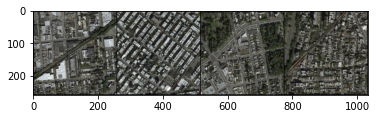

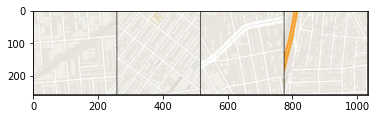

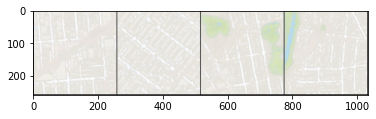

Epoch 8: Step 4600: Generator (U-Net) loss: 8.705144088268279, Discriminator loss: 0.5574560926854609


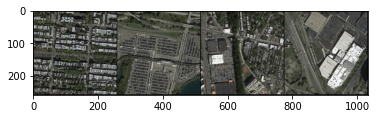

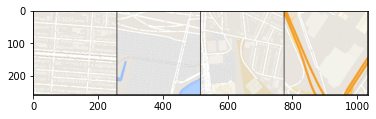

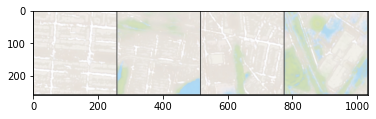

Epoch 8: Step 4800: Generator (U-Net) loss: 8.577970752716062, Discriminator loss: 0.5536129306256771


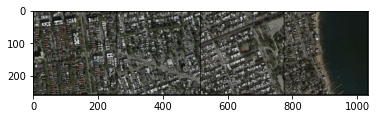

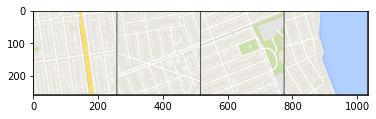

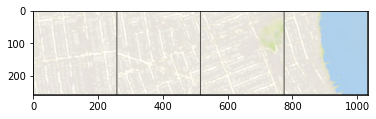

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 9: Step 5000: Generator (U-Net) loss: 8.846090247631079, Discriminator loss: 0.5296968975663187


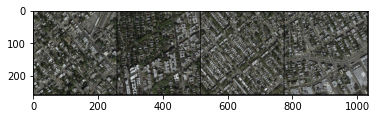

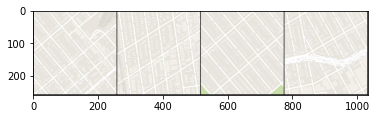

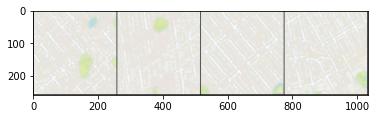

Epoch 9: Step 5200: Generator (U-Net) loss: 8.56695871353149, Discriminator loss: 0.6002407611906527


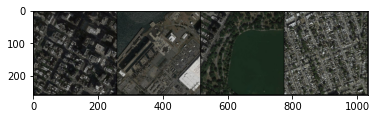

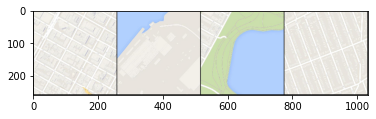

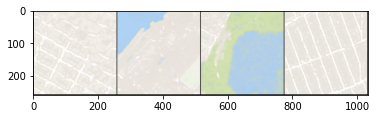

Epoch 9: Step 5400: Generator (U-Net) loss: 8.259894583225249, Discriminator loss: 0.6908404463529592


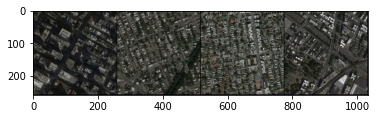

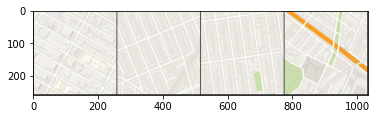

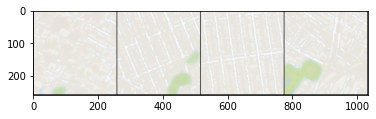

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 10: Step 5600: Generator (U-Net) loss: 8.460012731552126, Discriminator loss: 0.6906129789352417


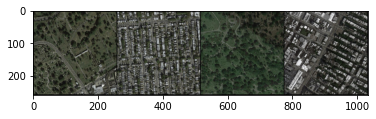

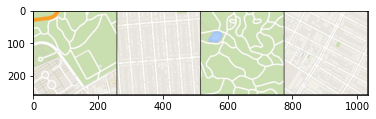

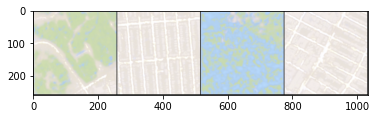

Epoch 10: Step 5800: Generator (U-Net) loss: 8.172511494159696, Discriminator loss: 0.6923101970553397


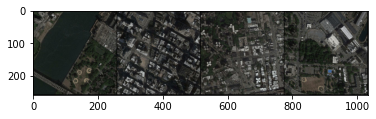

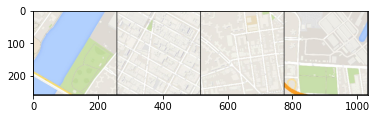

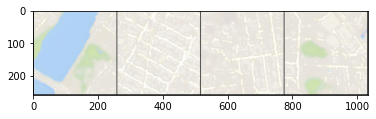

Epoch 10: Step 6000: Generator (U-Net) loss: 8.18620933771133, Discriminator loss: 0.636025122255087


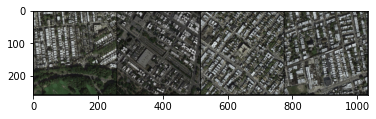

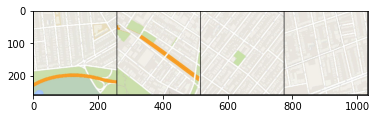

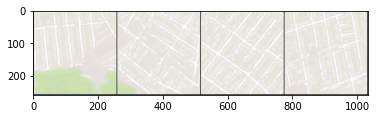

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 11: Step 6200: Generator (U-Net) loss: 8.015320413112638, Discriminator loss: 0.6075898326933382


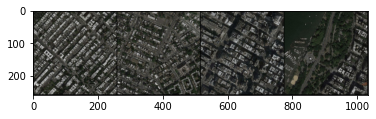

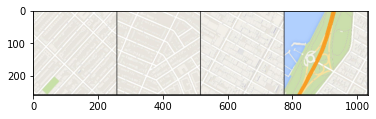

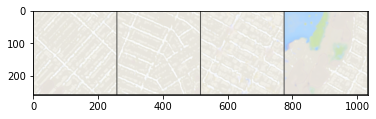

Epoch 11: Step 6400: Generator (U-Net) loss: 7.9939837646484335, Discriminator loss: 0.6928279146552084


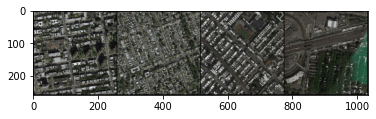

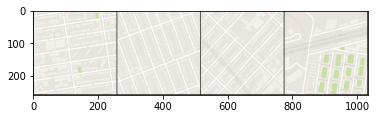

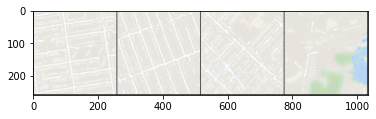

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 12: Step 6600: Generator (U-Net) loss: 8.21568891048431, Discriminator loss: 0.6048018488287926


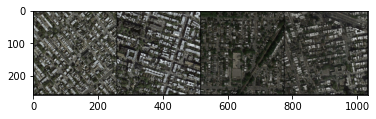

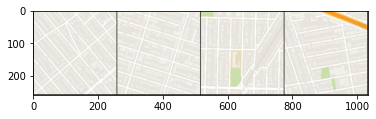

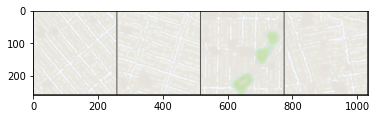

Epoch 12: Step 6800: Generator (U-Net) loss: 8.059585440158841, Discriminator loss: 0.5541932561993601


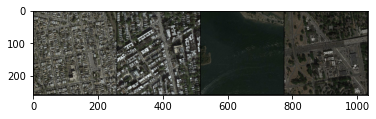

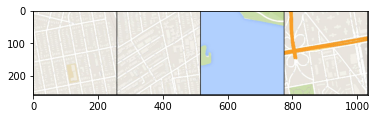

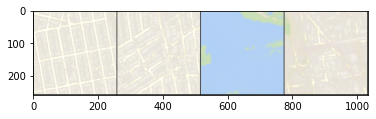

Epoch 12: Step 7000: Generator (U-Net) loss: 8.053507616519926, Discriminator loss: 0.5579227541387086


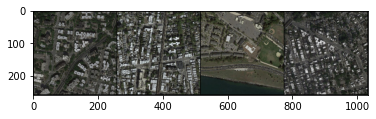

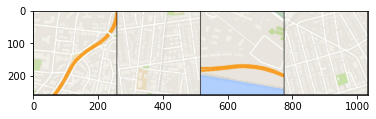

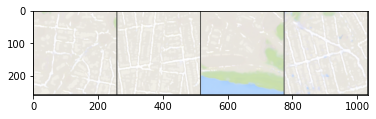

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 13: Step 7200: Generator (U-Net) loss: 7.830432214736939, Discriminator loss: 0.5503236970305443


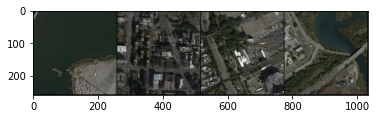

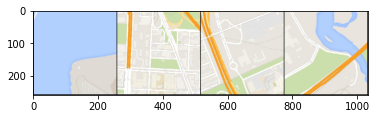

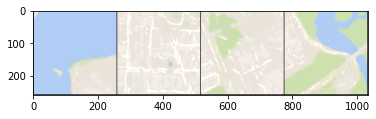

Epoch 13: Step 7400: Generator (U-Net) loss: 7.658462646007538, Discriminator loss: 0.5415816007554534


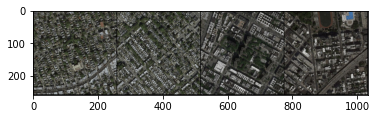

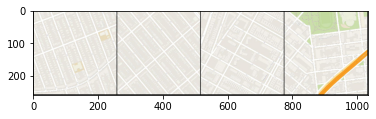

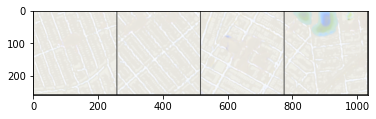

Epoch 13: Step 7600: Generator (U-Net) loss: 7.840759592056275, Discriminator loss: 0.5226390585303308


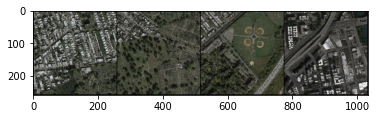

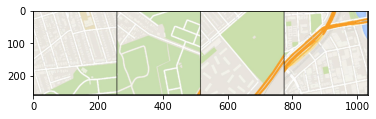

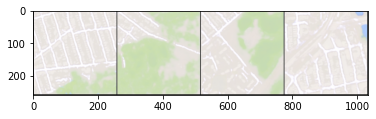

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 14: Step 7800: Generator (U-Net) loss: 7.862030999660484, Discriminator loss: 0.5218021303415297


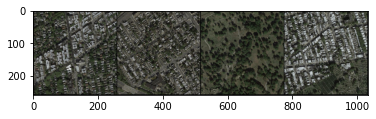

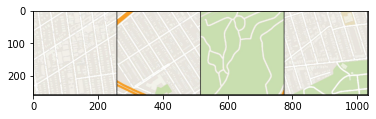

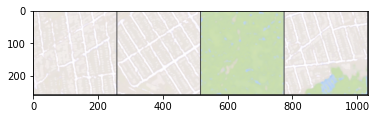

Epoch 14: Step 8000: Generator (U-Net) loss: 7.442278954982758, Discriminator loss: 0.5255673158168794


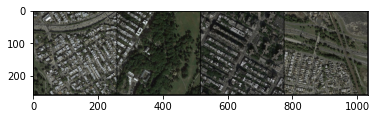

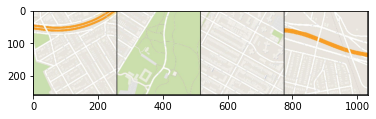

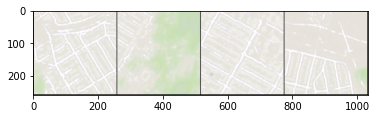

Epoch 14: Step 8200: Generator (U-Net) loss: 7.839397029876709, Discriminator loss: 0.5174151167273524


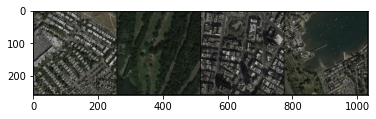

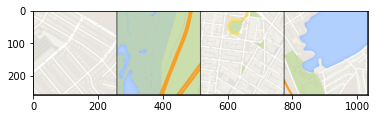

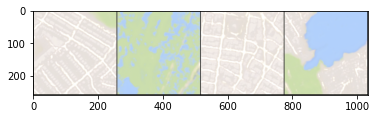

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 15: Step 8400: Generator (U-Net) loss: 7.609468731880189, Discriminator loss: 0.5028012551367285


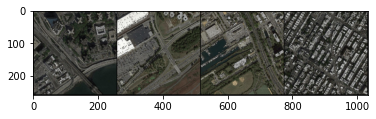

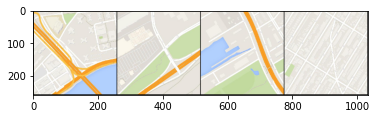

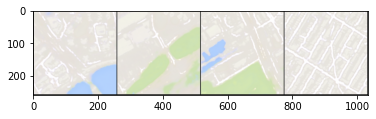

Epoch 15: Step 8600: Generator (U-Net) loss: 7.547797572612757, Discriminator loss: 0.5005351281166077


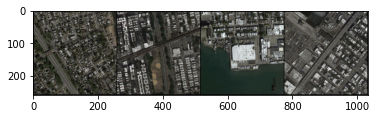

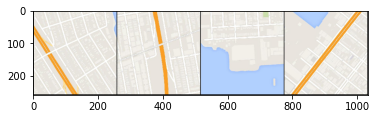

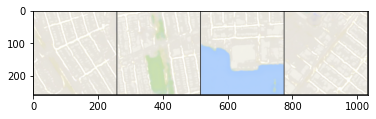

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 16: Step 8800: Generator (U-Net) loss: 7.628114411830901, Discriminator loss: 0.5072027552127837


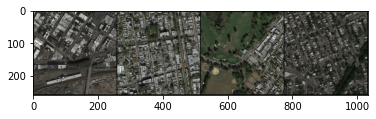

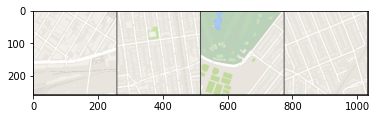

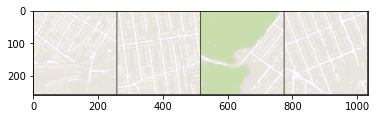

Epoch 16: Step 9000: Generator (U-Net) loss: 7.564328353405001, Discriminator loss: 0.48250814974308026


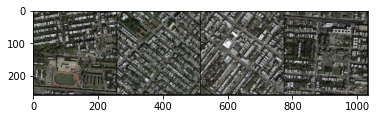

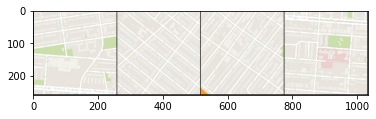

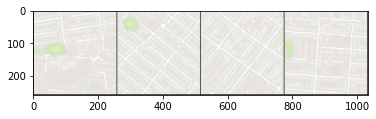

Epoch 16: Step 9200: Generator (U-Net) loss: 7.411260442733763, Discriminator loss: 0.492515542805195


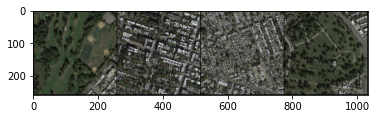

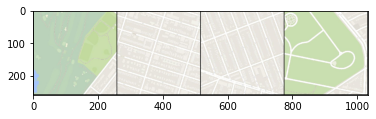

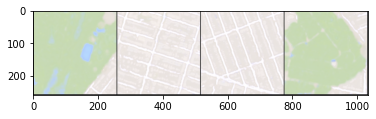

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 17: Step 9400: Generator (U-Net) loss: 7.575642511844637, Discriminator loss: 0.4805863644182684


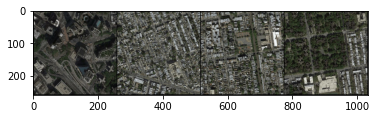

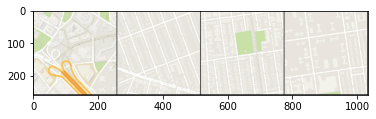

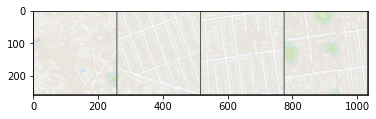

Epoch 17: Step 9600: Generator (U-Net) loss: 7.711361091136936, Discriminator loss: 0.4815359088778496


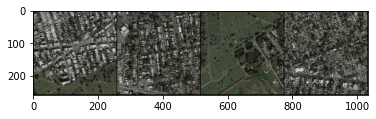

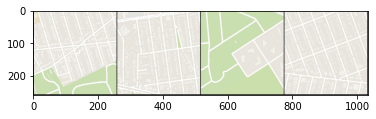

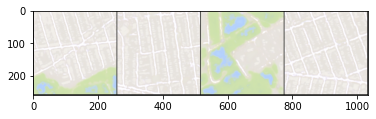

Epoch 17: Step 9800: Generator (U-Net) loss: 7.336250092983248, Discriminator loss: 0.4868105068802834


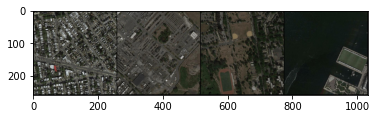

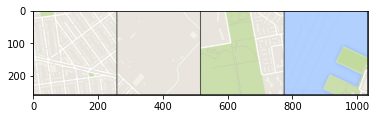

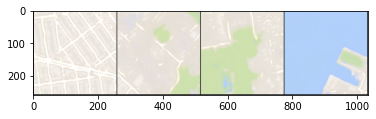

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 18: Step 10000: Generator (U-Net) loss: 7.32870879173279, Discriminator loss: 0.49908197253942516


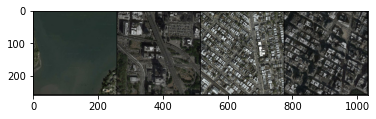

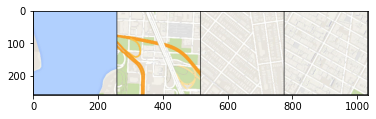

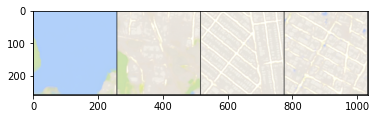

Epoch 18: Step 10200: Generator (U-Net) loss: 7.3756593847274825, Discriminator loss: 0.4785695764422416


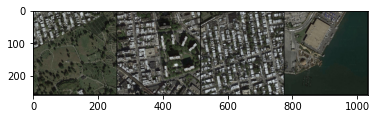

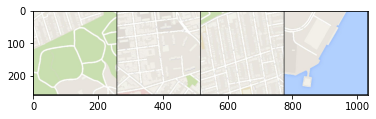

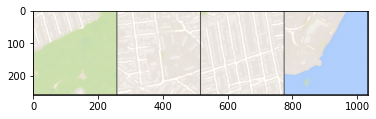

Epoch 18: Step 10400: Generator (U-Net) loss: 7.465525867938991, Discriminator loss: 0.46000406116247194


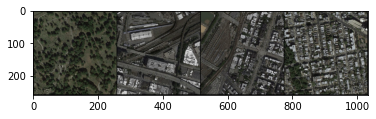

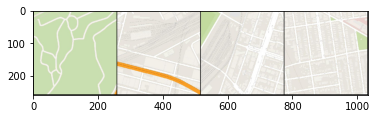

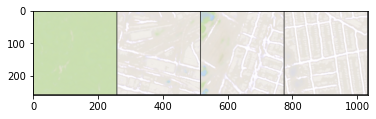

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 19: Step 10600: Generator (U-Net) loss: 7.34350445270538, Discriminator loss: 0.46362852528691295


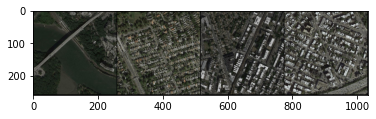

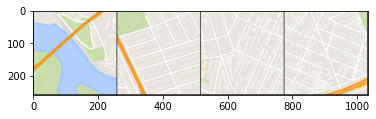

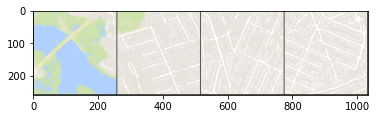

Epoch 19: Step 10800: Generator (U-Net) loss: 7.210209319591521, Discriminator loss: 0.4747368304431438


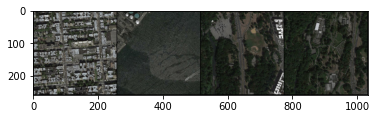

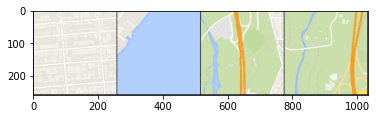

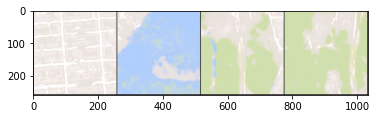

In [14]:
from skimage import color
import numpy as np

def train(save_model=False):
  mean_generator_loss = 0
  mean_discriminator_loss = 0
  dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
  cur_step = 0

  for epoch in range(n_epochs):
    for image, _ in tqdm(dataloader):
      image_width = image.shape[3]
      condition = image[:, :, :, :image_width // 2]
      condition = nn.functional.interpolate(condition, size=target_shape)
      real = image[:, :, :, image_width // 2:]
      real = nn.functional.interpolate(real, size=target_shape)
      cur_batch_size = len(condition)
      condition = condition.to(device)
      real = real.to(device)

      disc_opt.zero_grad()
      with torch.no_grad():
        fake = gen(condition)
      disc_fake_hat = disc(fake.detach(), condition)
      disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
      disc_real_hat = disc(real, condition)
      disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
      disc_loss = (disc_fake_loss + disc_real_loss) / 2
      disc_loss.backward(retain_graph=True)
      disc_opt.step()

      gen_opt.zero_grad()
      gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)
      gen_loss.backward()
      gen_opt.step()

      mean_discriminator_loss += disc_loss.item() / display_step
      mean_generator_loss += gen_loss.item() / display_step

      if cur_step % display_step == 0:
        if cur_step > 0:
          print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
        else:
          print("Pretrained inital state")
        show_tensor_images(condition, size=(input_dim, target_shape, target_shape))
        show_tensor_images(real, size=(real_dim, target_shape, target_shape))
        show_tensor_images(fake, size=(real_dim, target_shape, target_shape))
        mean_generator_loss = 0
        mean_discriminator_loss = 0
        
        if save_model:
          torch.save({'gen': gen.state_dict(),
                      'gen_opt': gen_opt.state_dict(),
                      'disc': disc.state_dict(),
                      'disc_opt': disc_opt.state_dict()}, f"pix2pix_{cur_step}.pth")
      cur_step += 1
train()